In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
from ydata_profiling import ProfileReport

In [2]:
movies = pd.read_csv('../data/movies_limpio.csv')
print(movies.shape)
print(movies.columns)

(45331, 21)
Index(['belongs_to_collection', 'budget', 'genres', 'original_language',
       'overview', 'popularity', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'vote_average',
       'vote_count', 'release_year', 'return', 'cast', 'director'],
      dtype='object')


# chequeo de no nulos

<Axes: >

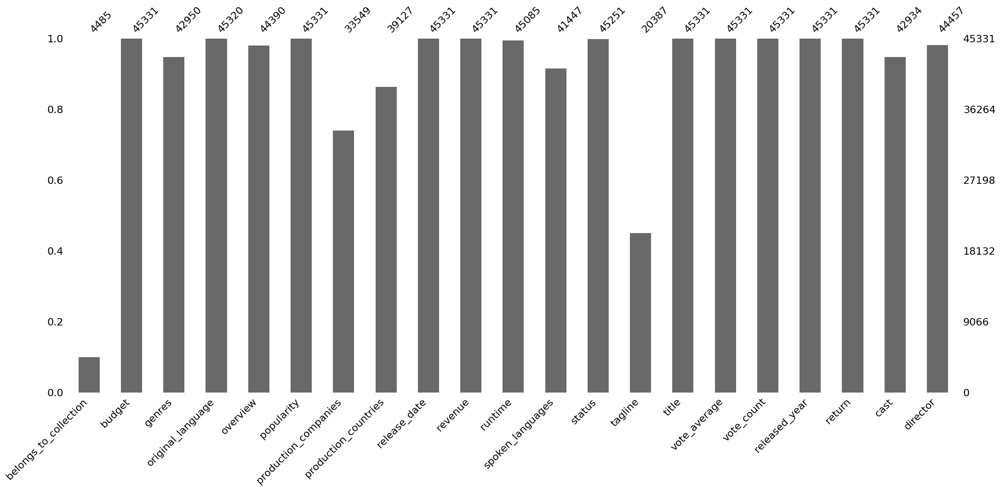

In [25]:
msno.bar(movies)

belongs to colections tiene un gran porcentage de nulos y no se pueden rellenar<br>
production companies, production countries, spoken languges, cast y director tienen algunas filas nulas y no se pueden rellenar<br>

In [26]:
profile = ProfileReport(movies)
profile

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.37s/it]


# chequeo de duplicados

In [5]:
print(movies.shape)
print(movies.nunique())

(45331, 21)
belongs_to_collection     1693
budget                    1223
genres                    4062
original_language           89
overview                 44203
popularity               43700
production_companies     22658
production_countries      2382
release_date             17329
revenue                   6861
runtime                    353
spoken_languages          1841
status                       6
tagline                  20263
title                    42173
vote_average                92
vote_count                1820
released_year              135
return                    5230
cast                     42587
director                 17539
dtype: int64


# tipos de datos

In [28]:
print(movies.dtypes)

belongs_to_collection     object
budget                     int64
genres                    object
original_language         object
overview                  object
popularity               float64
production_companies      object
production_countries      object
release_date              object
revenue                    int64
runtime                  float64
spoken_languages          object
status                    object
tagline                   object
title                     object
vote_average             float64
vote_count               float64
released_year              int64
return                   float64
cast                      object
director                  object
dtype: object


cabe resaltar que release date es un datetime pero al pasarlo a csv denuevo se convirtio en un object

# analisis estadistico

In [29]:
print(movies.describe())

             budget    popularity       revenue       runtime  vote_average  \
count  4.533100e+04  45331.000000  4.533100e+04  45085.000000  45331.000000   
mean   4.235988e+06      2.927622  1.124037e+07     94.175313      5.624328   
std    1.744775e+07      6.012035  6.442088e+07     38.344264      1.915074   
min    0.000000e+00      0.000000  0.000000e+00      0.000000      0.000000   
25%    0.000000e+00      0.388910  0.000000e+00     85.000000      5.000000   
50%    0.000000e+00      1.131061  0.000000e+00     95.000000      6.000000   
75%    0.000000e+00      3.694370  0.000000e+00    107.000000      6.800000   
max    3.800000e+08    547.488298  2.787965e+09   1256.000000     10.000000   

         vote_count  released_year        return  
count  45331.000000   45331.000000  4.533100e+04  
mean     110.182370    1991.884781  6.606978e+02  
std      491.976896      24.050958  7.473036e+04  
min        0.000000    1874.000000  0.000000e+00  
25%        3.000000    1978.00000

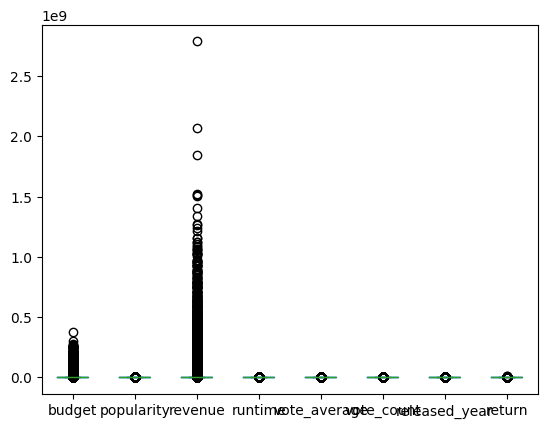

In [30]:
ax = movies[['budget', 'popularity', 'revenue', 'runtime', 'vote_average', 'vote_count', 'release_year', 'return']].plot.box()
plt.show()

# transformaciones

### eliminacion de columnas

- belongs_to_collection y tagline por la gran cantidad de nulos 
- budget, revenue y return por la gran cantidad de ceros
- popularity por tener muchos outlayers y ademas de tener un criterio de evalucion dificil de entender metricas extrañas y poca o ninguna documentacion sobre ello
- original_language no aporta informacion extra al modelo ya que existe tambien spoken_languages
- status, release_date, released_year, vote_average, vote_count y runtime no aportan ninguna informacion relevante para el modelo
- cast es una columna demasiado grande que realmente aporta poca informacion al modelo

In [4]:
movies = movies.drop(columns=['belongs_to_collection', 'tagline','budget', 'revenue', 'return', 'popularity', 'original_language', 'status', 'release_date', 'release_year', 'vote_average', 'vote_count', 'runtime','cast'])
movies

,genres,overview,production_companies,production_countries,spoken_languages,title,director
0,"Animation, Comedy, Family","Led by Woody, Andy's toys live happily in his ...",Pixar Animation Studios,United States of America,English,Toy Story,John Lasseter
1,"Adventure, Fantasy, Family",When siblings Judy and Peter discover an encha...,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,"English, Français",Jumanji,Joe Johnston
2,"Romance, Comedy",A family wedding reignites the ancient feud be...,"Warner Bros., Lancaster Gate",United States of America,English,Grumpier Old Men,Howard Deutch
3,"Comedy, Drama, Romance","Cheated on, mistreated and stepped on, the wom...",Twentieth Century Fox Film Corporation,United States of America,English,Waiting to Exhale,Forest Whitaker
4,Comedy,Just when George Banks has recovered from his ...,"Sandollar Productions, Touchstone Pictures",United States of America,English,Father of the Bride Part II,Charles Shyer
...,...,...,...,...,...,...,...
45326,"Drama, Action, Romance","Yet another version of the classic epic, with ...","Westdeutscher Rundfunk (WDR), Working Title Fi...","Canada, Germany, United Kingdom, United States...",English,Robin Hood,Georges Méliès
45327,Drama,An artist struggles to finish his work while a...,Sine Olivia,Philippines,NaN,Century of Birthing,Robert Gardner
45328,"Action, Drama, Thriller","When one of her hits goes wrong, a professiona...",American World Pictures,United States of America,English,Betrayal,Ravi Udyawar
45329,NaN,"In a small town live two brothers, one a minis...",Yermoliev,Russia,NaN,Satan Triumphant,Shanra J. Kehl


### eliminacion de filas

- se eliminan las filas con datos nulos

In [7]:
movies = movies.dropna()
movies.shape

(31227, 7)

In [48]:
movies

,genres,overview,production_companies,production_countries,spoken_languages,title,director
0,"Animation, Comedy, Family","Led by Woody, Andy's toys live happily in his ...",Pixar Animation Studios,United States of America,English,Toy Story,John Lasseter
1,"Adventure, Fantasy, Family",When siblings Judy and Peter discover an encha...,"TriStar Pictures, Teitler Film, Interscope Com...",United States of America,"English, Français",Jumanji,Joe Johnston
2,"Romance, Comedy",A family wedding reignites the ancient feud be...,"Warner Bros., Lancaster Gate",United States of America,English,Grumpier Old Men,Howard Deutch
3,"Comedy, Drama, Romance","Cheated on, mistreated and stepped on, the wom...",Twentieth Century Fox Film Corporation,United States of America,English,Waiting to Exhale,Forest Whitaker
4,Comedy,Just when George Banks has recovered from his ...,"Sandollar Productions, Touchstone Pictures",United States of America,English,Father of the Bride Part II,Charles Shyer
...,...,...,...,...,...,...,...
45322,"Horror, Mystery, Thriller",An unsuccessful sculptor saves a madman named ...,Universal Pictures,United States of America,English,House of Horrors,Georges Méliès
45324,Horror,A film archivist revisits the story of Rustin ...,"Neptune Salad Entertainment, Pirie Productions",United States of America,English,The Burkittsville 7,Georges Méliès
45325,Science Fiction,It's the year 3000 AD. The world's most danger...,Concorde-New Horizons,United States of America,English,Caged Heat 3000,Saul Blinkoff
45326,"Drama, Action, Romance","Yet another version of the classic epic, with ...","Westdeutscher Rundfunk (WDR), Working Title Fi...","Canada, Germany, United Kingdom, United States...",English,Robin Hood,Georges Méliès


In [10]:
ruta = '../data/moviesEDA.csv'
movies.to_csv(ruta,index = False, sep = ',')